# Capstone Project - Ocular Disease Recognition


## Information

**Data Source:** <br>
https://www.kaggle.com/datasets/andrewmvd/ocular-disease-recognition-odir5k

**About Dataset:** <br>
Ocular Disease Intelligent Recognition (ODIR) is a structured ophthalmic database of 5,000 patients with age, color fundus photographs from left and right eyes and doctors' diagnostic keywords from doctors.

This dataset is meant to represent ‘‘real-life’’ set of patient information collected by Shanggong Medical Technology Co., Ltd. from different hospitals/medical centers in China. In these institutions, fundus images are captured by various cameras in the market, such as Canon, Zeiss and Kowa, resulting into varied image resolutions.
Annotations were labeled by trained human readers with quality control management. They classify patient into eight labels including:

*   Normal (N)
*   Diabetes (D)
*   Glaucoma (G)
*   Cataract (C)
*   Age related Macular Degeneration (A),
*   Hypertension (H),
*   Pathological Myopia (M),
*   Other diseases/abnormalities (O)

## Environment Setup

### Mount Drive

In [ ]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization
drive.mount('/content/drive')

# Import Unzip Package
# import zipfile

# Unzip file
# location = '/content/drive/MyDrive/Capstone Project/archive.zip'
# zip_ref = zipfile.ZipFile(location, 'r')
# zip_ref.extractall('/content/drive/MyDrive/Capstone Project')

Mounted at /content/drive


### Import Libraries

In [ ]:
# Run this code before run any cell below
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import Flatten, Dense, Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2 
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.inception_v3 import InceptionV3

from keras.preprocessing.image import ImageDataGenerator

import pandas as pd

import cv2

import numpy as np

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import os
from os import listdir

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.utils.class_weight import compute_class_weight
from sklearn.utils import class_weight 

### Import CSV as Pandas DataFrame

In [ ]:
# Import data label CSV
df = pd.read_csv('/content/drive/MyDrive/Capstone Project/archive/full_df.csv')

# Show all data
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
display(df)

,ID,Patient Age,Patient Sex,Left-Fundus,Right-Fundus,Left-Diagnostic Keywords,Right-Diagnostic Keywords,N,D,G,C,A,H,M,O,filepath,labels,target,filename
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,1,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",0_right.jpg
1,1,57,Male,1_left.jpg,1_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",1_right.jpg
2,2,42,Male,2_left.jpg,2_right.jpg,laser spot，moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",2_right.jpg
3,4,53,Male,4_left.jpg,4_right.jpg,macular epiretinal membrane,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",4_right.jpg
4,5,50,Female,5_left.jpg,5_right.jpg,moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",5_right.jpg
5,6,60,Male,6_left.jpg,6_right.jpg,macular epiretinal membrane,moderate non proliferative retinopathy，epireti...,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",6_right.jpg
6,7,60,Female,7_left.jpg,7_right.jpg,drusen,mild nonproliferative retinopathy,0,1,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['D'],"[0, 1, 0, 0, 0, 0, 0, 0]",7_right.jpg
7,8,59,Male,8_left.jpg,8_right.jpg,normal fundus,normal fundus,1,0,0,0,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",8_right.jpg
8,9,54,Male,9_left.jpg,9_right.jpg,normal fundus,vitreous degeneration,0,0,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['O'],"[0, 0, 0, 0, 0, 0, 0, 1]",9_right.jpg
9,10,70,Male,10_left.jpg,10_right.jpg,epiretinal membrane,normal fundus,0,0,0,0,0,0,0,1,../input/ocular-disease-recognition-odir5k/ODI...,['N'],"[1, 0, 0, 0, 0, 0, 0, 0]",10_right.jpg


In [ ]:
# Dataframe slicing for filename and labels
df_1 = df.loc[:, ['filename','labels']]
display(df_1)

,filename,labels
0,0_right.jpg,['N']
1,1_right.jpg,['N']
2,2_right.jpg,['D']
3,4_right.jpg,['D']
4,5_right.jpg,['D']
5,6_right.jpg,['D']
6,7_right.jpg,['D']
7,8_right.jpg,['N']
8,9_right.jpg,['O']
9,10_right.jpg,['N']


### Assign Pre-Trained Models

In [ ]:
image_size = 512

vgg = VGG19(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))
mobilenetv2 = MobileNetV2(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))
mobilenetv3small = MobileNetV3Small(weights="imagenet",include_top = False,input_shape=(image_size,image_size,3))

for layer in vgg.layers:
  layer.trainable = False

for layer in mobilenetv2.layers:
  layer.trainable = False

for layer in mobilenetv3small.layers:
  layer.trainable = False

4349952/4334752 [==============================] - 0s 0us/step


In [ ]:
# Download the pre-trained weights. No top means it excludes the fully connected layer it uses for classification.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2022-06-02 12:58:02--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.4.128, 74.125.200.128, 74.125.68.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.4.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M   122MB/s    in 0.7s    

2022-06-02 12:58:03 (122 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
# Set the weights file you downloaded into a variable
local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

# Initialize the base model.
# Set the input shape and remove the dense layers.
pre_trained_model = InceptionV3(input_shape = (512, 512, 3), 
                                include_top = False, 
                                weights = None)

# Load the pre-trained weights you downloaded.
pre_trained_model.load_weights(local_weights_file)

# Freeze the weights of the layers.
for layer in pre_trained_model.layers:
  layer.trainable = False

In [ ]:
# Preprocessing Image (Grayscale)
def to_grayscale_then_rgb(image):
    image = tf.image.rgb_to_grayscale(image)
    image = tf.image.grayscale_to_rgb(image)
    return image

def to_blue(image):
    image = cv2.IMREAD_COLOR(image)
    return image

## Assign Directory & Data Checking

In [ ]:
# assign directory
directory_preprocessed = '/content/drive/MyDrive/Capstone Project/archive/preprocessed_images'
directory_train =  '/content/drive/MyDrive/Capstone Project/archive/ODIR_5K/ODIR_5K/Training Images'
directory_test =  '/content/drive/MyDrive/Capstone Project/archive/ODIR_5K/ODIR_5K/Testing Images'
 
# iterate over files in that directory
preprocessed_counter = 0
train_counter        = 0
test_counter         = 0

# Counting data
for image_name in os.listdir(directory_preprocessed):
  preprocessed_counter += 1

for image_name in os.listdir(directory_train):
  train_counter += 1

for image_name in os.listdir(directory_test):
  test_counter += 1

print(preprocessed_counter)
print(train_counter)
print(test_counter)

6392
7000
1000


## Models - All Labels

### Image Data Generator

In [ ]:
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = datagen.flow_from_dataframe(
    df_1,
    directory=directory_train,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
    subset='training'
)

validation_generator = datagen.flow_from_dataframe(
    df_1,
    directory=directory_train,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
    subset='validation'
)

Found 5114 validated image filenames belonging to 8 classes.
Found 1278 validated image filenames belonging to 8 classes.


### Standard CNN Model

#### # Model 1

In [ ]:
model = tf.keras.models.Sequential([
    # Note the input shape is the desired size of the image 512x512 with 3 bytes color
    # This is the first convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(512, 512, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The third convolution
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fourth convolution
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # Flatten the results to feed into a DNN
    tf.keras.layers.Flatten(),
    # 512 neuron hidden layer
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(8, activation='softmax')
])

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 510, 510, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 255, 255, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 253, 253, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 126, 126, 64)     0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 124, 124, 128)     73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 62, 62, 128)      0

In [ ]:
# Set the training parameters
model.compile(loss = 'categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [ ]:
# Train the model
history = model.fit(train_generator, 
                    validation_data = validation_generator, 
                    epochs=25, 
                    steps_per_epoch=20, 
                    validation_steps = 15,
                    verbose = 2)

Epoch 1/25
20/20 - 246s - loss: 5.2653 - accuracy: 0.4196 - val_loss: 2.9223 - val_accuracy: 0.2188 - 246s/epoch - 12s/step
Epoch 2/25
20/20 - 81s - loss: 1.5408 - accuracy: 0.4453 - val_loss: 2.6244 - val_accuracy: 0.2375 - 81s/epoch - 4s/step
Epoch 3/25
20/20 - 79s - loss: 1.4689 - accuracy: 0.5156 - val_loss: 2.4465 - val_accuracy: 0.2000 - 79s/epoch - 4s/step
Epoch 4/25
20/20 - 78s - loss: 1.4560 - accuracy: 0.4495 - val_loss: 2.3410 - val_accuracy: 0.2188 - 78s/epoch - 4s/step
Epoch 5/25
20/20 - 80s - loss: 1.4499 - accuracy: 0.4734 - val_loss: 2.3071 - val_accuracy: 0.1854 - 80s/epoch - 4s/step
Epoch 6/25
20/20 - 82s - loss: 1.4069 - accuracy: 0.5156 - val_loss: 2.1641 - val_accuracy: 0.2021 - 82s/epoch - 4s/step
Epoch 7/25
20/20 - 81s - loss: 1.4640 - accuracy: 0.5016 - val_loss: 2.1707 - val_accuracy: 0.2167 - 81s/epoch - 4s/step
Epoch 8/25
20/20 - 81s - loss: 1.4463 - accuracy: 0.5188 - val_loss: 2.2831 - val_accuracy: 0.2438 - 81s/epoch - 4s/step
Epoch 9/25
20/20 - 82s - loss

#### # Model 2

In [ ]:
model = tf.keras.models.Sequential([
    # Note the input shape is the desired size of the image 512x512 with 3 bytes color
    # This is the first convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(512, 512, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The third convolution
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fourth convolution
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # Flatten the results to feed into a DNN
    tf.keras.layers.Flatten(),
    # 512 neuron hidden layer
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(8, activation='softmax')
])

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 510, 510, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 255, 255, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 253, 253, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 126, 126, 64)     0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 124, 124, 128)     73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 62, 62, 128)      0

In [ ]:
# Set the training parameters
model.compile(loss = 'categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [ ]:
# Train the model
history = model.fit(train_generator, 
                    validation_data = validation_generator, 
                    epochs=35, 
                    steps_per_epoch=20, 
                    validation_steps = 15,
                    verbose = 2)

Epoch 1/35
20/20 - 382s - loss: 3.0284 - accuracy: 0.3516 - val_loss: 1.9225 - val_accuracy: 0.2333 - 382s/epoch - 19s/step
Epoch 2/35
20/20 - 285s - loss: 1.5460 - accuracy: 0.4953 - val_loss: 2.2149 - val_accuracy: 0.2167 - 285s/epoch - 14s/step
Epoch 3/35
20/20 - 233s - loss: 1.4367 - accuracy: 0.5000 - val_loss: 2.3553 - val_accuracy: 0.2271 - 233s/epoch - 12s/step
Epoch 4/35
20/20 - 208s - loss: 1.5018 - accuracy: 0.4968 - val_loss: 1.9737 - val_accuracy: 0.2458 - 208s/epoch - 10s/step
Epoch 5/35
20/20 - 172s - loss: 1.4516 - accuracy: 0.4984 - val_loss: 2.0674 - val_accuracy: 0.2167 - 172s/epoch - 9s/step
Epoch 6/35
20/20 - 156s - loss: 1.4881 - accuracy: 0.5047 - val_loss: 2.0684 - val_accuracy: 0.2271 - 156s/epoch - 8s/step
Epoch 7/35
20/20 - 142s - loss: 1.4584 - accuracy: 0.4688 - val_loss: 2.0454 - val_accuracy: 0.2604 - 142s/epoch - 7s/step
Epoch 8/35
20/20 - 129s - loss: 1.5199 - accuracy: 0.4401 - val_loss: 2.0478 - val_accuracy: 0.2021 - 129s/epoch - 6s/step
Epoch 9/35
2

## Models - Cataract



### Data Slicing

In [ ]:
# Dataframe slicing (Cataract)
df_cat = df.loc[df['labels'] == "['C']", ['filename','labels']]
df_cat_augment = shuffle(df_cat)
# df_cat_augment.head()

# Dataframe slicing (Normal)
df_norm = df.loc[df['labels'] == "['N']", ['filename','labels']]
# df_norm.tail()

# Merged Dataframe (Cataract)
df_2 = pd.concat([df_cat_augment, df_norm], ignore_index=True, sort=False)
df_2 = shuffle(df_2)

# Split Train and Test from Dataframe
train, val = train_test_split(df_2, test_size=0.2)

In [ ]:
print(train[train['labels']=="['C']"].labels.count())
print(train[train['labels']=="['N']"].labels.count())
print(val[val['labels']=="['C']"].labels.count())
print(val[val['labels']=="['N']"].labels.count())

234
2298
59
575


### Image Data Generator

In [ ]:
traingen = ImageDataGenerator(rescale=1./255.,
                              horizontal_flip = True,
                              vertical_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    directory=directory_train,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='binary',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    directory=directory_train,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='binary',
)

Found 2532 validated image filenames belonging to 2 classes.
Found 634 validated image filenames belonging to 2 classes.


### Model 1
Using built-in function from sklearn to generate class weight for handling imbalanced dataset

In [ ]:
class_weights = class_weight.compute_class_weight(class_weight='balanced',
                                                 classes=np.unique(train.labels),
                                                 y=train.labels)
train_classes = train_generator.classes
class_weights = dict(zip(np.unique(train_classes), class_weights))
print(class_weights)

{0: 5.410256410256411, 1: 0.5509138381201044}


In [ ]:
model = tf.keras.models.Sequential([
    # Note the input shape is the desired size of the image 512x512 with 3 bytes color
    # This is the first convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(512, 512, 3)),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The third convolution
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fourth convolution
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # Flatten the results to feed into a DNN
    tf.keras.layers.Flatten(),
    # 512 neuron hidden layer
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(1, activation='softmax')
])

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 510, 510, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 255, 255, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 253, 253, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 126, 126, 64)     0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 124, 124, 128)     73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 62, 62, 128)      0

In [ ]:
# Set the training parameters
model.compile(loss='binary_crossentropy', optimizer=RMSprop(learning_rate=0.001), metrics=['accuracy'])

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=15,
                    batch_size=32,
                    validation_steps = 15,
                    class_weight=class_weights,
                    verbose = 1)

Epoch 1/15
80/80 [==============================] - 176s 2s/step - loss: 0.6937 - accuracy: 0.9076 - val_loss: 0.9613 - val_accuracy: 0.9000
Epoch 2/15
80/80 [==============================] - 173s 2s/step - loss: 0.7746 - accuracy: 0.9076 - val_loss: 0.7201 - val_accuracy: 0.9104
Epoch 3/15
80/80 [==============================] - 172s 2s/step - loss: 0.6994 - accuracy: 0.9076 - val_loss: 0.5578 - val_accuracy: 0.9021
Epoch 4/15
80/80 [==============================] - 171s 2s/step - loss: 0.6551 - accuracy: 0.9076 - val_loss: 0.5950 - val_accuracy: 0.8938
Epoch 5/15
80/80 [==============================] - 167s 2s/step - loss: 0.6248 - accuracy: 0.9076 - val_loss: 0.5393 - val_accuracy: 0.9208
Epoch 6/15
80/80 [==============================] - 168s 2s/step - loss: 0.6067 - accuracy: 0.9076 - val_loss: 0.4427 - val_accuracy: 0.9062
Epoch 7/15
80/80 [==============================] - 167s 2s/step - loss: 0.6294 - accuracy: 0.9076 - val_loss: 0.5395 - val_accuracy: 0.9000
Epoch 8/15
80

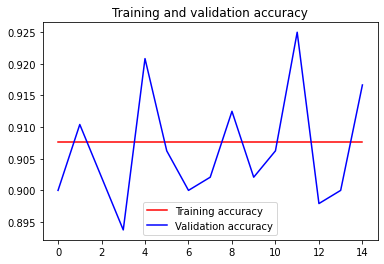

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

### Model 2
MobileNetV2 without class weight

In [ ]:
model = Sequential()
model.add(mobilenetv2)
model.add(Flatten())
model.add(Dense(1, activation="sigmoid"))

# Print the model summary
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 16, 16, 1280)     2257984   
 ional)                                                          
                                                                 
 flatten_2 (Flatten)         (None, 327680)            0         
                                                                 
 dense_3 (Dense)             (None, 1)                 327681    
                                                                 
Total params: 2,585,665
Trainable params: 327,681
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=5,verbose=1)

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=15,
                    batch_size=32,
                    validation_steps = 15,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/15
80/80 [==============================] - ETA: 0s - loss: 1.0859 - accuracy: 0.9684
Epoch 1: val_accuracy improved from -inf to 0.96250, saving model to CapstoneModel.h5
80/80 [==============================] - 170s 2s/step - loss: 1.0859 - accuracy: 0.9684 - val_loss: 1.4331 - val_accuracy: 0.9625
Epoch 2/15
80/80 [==============================] - ETA: 0s - loss: 0.7213 - accuracy: 0.9739
Epoch 2: val_accuracy did not improve from 0.96250
80/80 [==============================] - 164s 2s/step - loss: 0.7213 - accuracy: 0.9739 - val_loss: 0.9443 - val_accuracy: 0.9604
Epoch 3/15
80/80 [==============================] - ETA: 0s - loss: 0.8272 - accuracy: 0.9735
Epoch 3: val_accuracy did not improve from 0.96250
80/80 [==============================] - 165s 2s/step - loss: 0.8272 - accuracy: 0.9735 - val_loss: 1.5290 - val_accuracy: 0.9625
Epoch 4/15
80/80 [==============================] - ETA: 0s - loss: 0.5241 - accuracy: 0.9806
Epoch 4: val_accuracy did not improve from 0.9

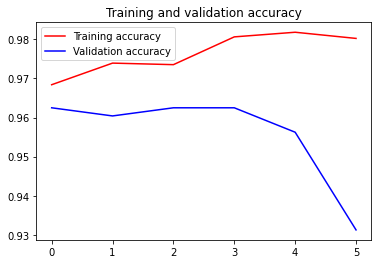

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

In [ ]:
tf.keras.backend.clear_session()

### Model 3
MobileNetV2 with class weight

In [ ]:
class_weights = class_weight.compute_class_weight(class_weight='balanced',
                                                 classes=np.unique(train.labels),
                                                 y=train.labels)
train_classes = train_generator.classes
class_weights = dict(zip(np.unique(train_classes), class_weights))
print(class_weights)

{0: 5.410256410256411, 1: 0.5509138381201044}


In [ ]:
model = Sequential()
model.add(mobilenetv2)
model.add(Flatten())
model.add(Dense(1, activation="sigmoid"))

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 16, 16, 1280)     2257984   
 ional)                                                          
                                                                 
 flatten (Flatten)           (None, 327680)            0         
                                                                 
 dense (Dense)               (None, 1)                 327681    
                                                                 
Total params: 2,585,665
Trainable params: 327,681
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=5,verbose=1)

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=15,
                    batch_size=32,
                    validation_steps = 15,
                    callbacks=[checkpoint,earlystop],
                    class_weight=class_weights,
                    verbose = 1)

Epoch 1/15
80/80 [==============================] - ETA: 0s - loss: 4.3267 - accuracy: 0.9056
Epoch 1: val_accuracy improved from -inf to 0.89375, saving model to CapstoneModel.h5
80/80 [==============================] - 178s 2s/step - loss: 4.3267 - accuracy: 0.9056 - val_loss: 3.2779 - val_accuracy: 0.8938
Epoch 2/15
80/80 [==============================] - ETA: 0s - loss: 2.4776 - accuracy: 0.9313
Epoch 2: val_accuracy improved from 0.89375 to 0.96042, saving model to CapstoneModel.h5
80/80 [==============================] - 169s 2s/step - loss: 2.4776 - accuracy: 0.9313 - val_loss: 1.8434 - val_accuracy: 0.9604
Epoch 3/15
80/80 [==============================] - ETA: 0s - loss: 1.5539 - accuracy: 0.9554
Epoch 3: val_accuracy did not improve from 0.96042
80/80 [==============================] - 165s 2s/step - loss: 1.5539 - accuracy: 0.9554 - val_loss: 1.8783 - val_accuracy: 0.9604
Epoch 4/15
80/80 [==============================] - ETA: 0s - loss: 2.8442 - accuracy: 0.9380
Epoch 4:

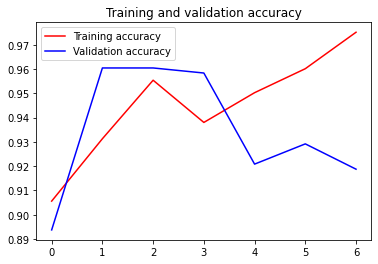

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.show()

## Models - Cataract, Normal, Diabetes, Glaucoma, Age related Macular Degeneration

### Data Slicing

In [ ]:
# Dataframe slicing (Cataract)
df_cat = df.loc[df['labels'] == "['C']", ['filename','labels']]
df_cat_augment = shuffle(df_cat)
# df_cat_augment.head()

# Dataframe slicing (Normal)
df_norm = df.loc[df['labels'] == "['N']", ['filename','labels']]
# df_norm.tail()

# Dataframe slicing (Diabetes)
df_diabet = df.loc[df['labels'] == "['D']", ['filename','labels']]

# Dataframe slicing (Glaucoma)
df_gl = df.loc[df['labels'] == "['G']", ['filename','labels']]

# Dataframe slicing (Age related Macular Degeneration)
df_age = df.loc[df['labels'] == "['A']", ['filename','labels']]

print('Cataract Train : ',df_cat.count())
print('Normal Train   : ',df_norm.count())
print('Diabetes Train : ',df_diabet.count())
print('Glaucoma Train : ',df_gl.count())
print('Age Train      : ',df_age.count())

Cataract Train :  filename    293
labels      293
dtype: int64
Normal Train   :  filename    2873
labels      2873
dtype: int64
Diabetes Train :  filename    1608
labels      1608
dtype: int64
Glaucoma Train :  filename    284
labels      284
dtype: int64
Age Train      :  filename    266
labels      266
dtype: int64


In [ ]:
# Merged Dataframe (Cataract)
df_2 = pd.concat([df_cat_augment[:266], df_norm[:266], df_diabet[:266], df_gl[:266], df_age[:266]], ignore_index=True, sort=False)
df_2 = shuffle(df_2)

# Split Train and Test from Dataframe
train, val = train_test_split(df_2, test_size=0.2)

In [ ]:
print('Cataract Train Count: ',train[train['labels']=="['C']"].labels.count())
print('Normal Train Count  : ',train[train['labels']=="['N']"].labels.count())
print('Diabetes Train Count: ',train[train['labels']=="['D']"].labels.count())
print('Glaucoma Train Count: ',train[train['labels']=="['G']"].labels.count())
print('Age Train Count     : ',train[train['labels']=="['A']"].labels.count())
print('Cataract Validation Count: ',val[val['labels']=="['C']"].labels.count())
print('Normal Validation Count  : ',val[val['labels']=="['N']"].labels.count())
print('Diabetes Validation Count: ',val[val['labels']=="['D']"].labels.count())
print('Glaucoma Validation Count: ',val[val['labels']=="['G']"].labels.count())
print('Age Validation Count     : ',val[val['labels']=="['A']"].labels.count())

Cataract Train Count:  213
Normal Train Count  :  210
Diabetes Train Count:  216
Glaucoma Train Count:  220
Age Train Count     :  205
Cataract Validation Count:  53
Normal Validation Count  :  56
Diabetes Validation Count:  50
Glaucoma Validation Count:  46
Age Validation Count     :  61


In [ ]:
tf.keras.backend.clear_session()

### Image Data Generator

In [ ]:
traingen = ImageDataGenerator(rescale=1./255.,
                              horizontal_flip = True,
                              vertical_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    directory=directory_train,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    directory=directory_train,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

Found 4259 validated image filenames belonging to 5 classes.
Found 1065 validated image filenames belonging to 5 classes.


### Model 1
MobileNetV2 without class weight

In [ ]:
model = Sequential()
model.add(mobilenetv2)
model.add(Flatten())
model.add(Dense(5, activation="softmax"))

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 16, 16, 1280)     2257984   
 ional)                                                          
                                                                 
 flatten (Flatten)           (None, 327680)            0         
                                                                 
 dense (Dense)               (None, 5)                 1638405   
                                                                 
Total params: 3,896,389
Trainable params: 1,638,405
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=5,verbose=1)

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=15,
                    batch_size=32,
                    validation_steps = 15,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/15
134/134 [==============================] - ETA: 0s - loss: 17.6545 - accuracy: 0.5175 
Epoch 1: val_accuracy improved from -inf to 0.40625, saving model to CapstoneModel.h5
134/134 [==============================] - 1777s 13s/step - loss: 17.6545 - accuracy: 0.5175 - val_loss: 16.7250 - val_accuracy: 0.4062
Epoch 2/15
134/134 [==============================] - ETA: 0s - loss: 10.6494 - accuracy: 0.6168
Epoch 2: val_accuracy improved from 0.40625 to 0.46042, saving model to CapstoneModel.h5
134/134 [==============================] - 345s 3s/step - loss: 10.6494 - accuracy: 0.6168 - val_loss: 17.5377 - val_accuracy: 0.4604
Epoch 3/15
134/134 [==============================] - ETA: 0s - loss: 10.7698 - accuracy: 0.6546
Epoch 3: val_accuracy improved from 0.46042 to 0.60417, saving model to CapstoneModel.h5
134/134 [==============================] - 306s 2s/step - loss: 10.7698 - accuracy: 0.6546 - val_loss: 11.2951 - val_accuracy: 0.6042
Epoch 4/15
134/134 [====================

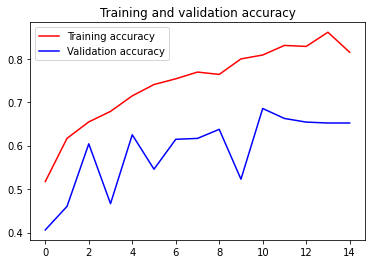

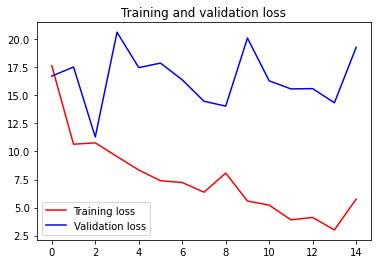

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

### Model 2
MobileNetV2 with class weight

In [ ]:
class_weights = class_weight.compute_class_weight(class_weight='balanced',
                                                 classes=np.unique(train.labels),
                                                 y=train.labels)
train_classes = train_generator.classes
class_weights = dict(zip(np.unique(train_classes), class_weights))
print(class_weights)

{0: 4.075598086124402, 1: 3.5789915966386556, 2: 0.6659890539483971, 3: 3.609322033898305, 4: 0.37083151937309533}


In [ ]:
model = Sequential()
model.add(mobilenetv2)
model.add(Flatten())
model.add(Dense(5, activation="softmax"))

# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 16, 16, 1280)     2257984   
 ional)                                                          
                                                                 
 flatten (Flatten)           (None, 327680)            0         
                                                                 
 dense (Dense)               (None, 5)                 1638405   
                                                                 
Total params: 3,896,389
Trainable params: 1,638,405
Non-trainable params: 2,257,984
_________________________________________________________________


In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=5,verbose=1)

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=15,
                    batch_size=32,
                    validation_steps = 15,
                    callbacks=[checkpoint,earlystop],
                    class_weight=class_weights,
                    verbose = 1)

Epoch 1/15
134/134 [==============================] - ETA: 0s - loss: 25.3035 - accuracy: 0.3707
Epoch 1: val_accuracy improved from -inf to 0.37292, saving model to CapstoneModel.h5
134/134 [==============================] - 1110s 8s/step - loss: 25.3035 - accuracy: 0.3707 - val_loss: 25.1997 - val_accuracy: 0.3729
Epoch 2/15
134/134 [==============================] - ETA: 0s - loss: 16.6465 - accuracy: 0.4849
Epoch 2: val_accuracy improved from 0.37292 to 0.53542, saving model to CapstoneModel.h5
134/134 [==============================] - 1054s 8s/step - loss: 16.6465 - accuracy: 0.4849 - val_loss: 16.1820 - val_accuracy: 0.5354
Epoch 3/15
134/134 [==============================] - ETA: 0s - loss: 14.8221 - accuracy: 0.5283
Epoch 3: val_accuracy improved from 0.53542 to 0.60000, saving model to CapstoneModel.h5
134/134 [==============================] - 930s 7s/step - loss: 14.8221 - accuracy: 0.5283 - val_loss: 21.7579 - val_accuracy: 0.6000
Epoch 4/15
134/134 [=====================

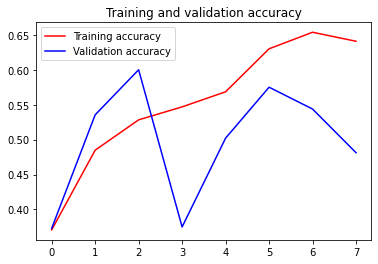

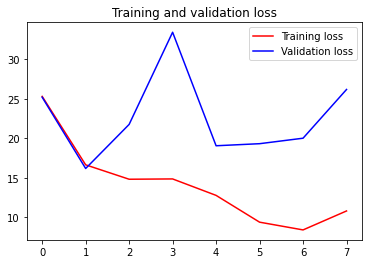

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

### Model 3
MobileNetV2 with class weight and grayscale

In [ ]:
traingen = ImageDataGenerator(rescale=1./255.,
                              rotation_range = 10,
                              horizontal_flip = True,
                              vertical_flip = True)

train_generator = traingen.flow_from_dataframe(
    train,
    directory=directory_train,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

valgen = ImageDataGenerator(rescale=1./255.)

validation_generator = valgen.flow_from_dataframe(
    val,
    directory=directory_train,
    target_size=(512, 512),
    x_col='filename',
    y_col='labels',
    class_mode='categorical',
)

Found 1064 validated image filenames belonging to 5 classes.
Found 266 validated image filenames belonging to 5 classes.


In [ ]:
class_weights = class_weight.compute_class_weight(class_weight='balanced',
                                                 classes=np.unique(train.labels),
                                                 y=train.labels)
train_classes = train_generator.classes
class_weights = dict(zip(np.unique(train_classes), class_weights))
print(class_weights)

{0: 1.038048780487805, 1: 0.9990610328638497, 2: 0.9851851851851852, 3: 0.9672727272727273, 4: 1.0133333333333334}


In [ ]:
model = Sequential()
model.add(mobilenetv2)
model.add(Conv2D(128, (3,3), activation='relu'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
# model.add(Dense(128, activation="relu"))
model.add(Dense(5, activation="softmax"))

# Print the model summary
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 16, 16, 1280)     2257984   
 ional)                                                          
                                                                 
 conv2d_100 (Conv2D)         (None, 14, 14, 128)       1474688   
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 7, 7, 128)        0         
 2D)                                                             
                                                                 
 flatten_8 (Flatten)         (None, 6272)              0         
                                                                 
 dense_21 (Dense)            (None, 5)                 31365     
                                                                 
Total params: 3,764,037
Trainable params: 1,506,053
No

In [ ]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])

checkpoint = ModelCheckpoint("CapstoneModel.h5",monitor="val_accuracy",verbose=1,save_best_only=True,
                             save_weights_only=False,period=1)
earlystop = EarlyStopping(monitor="val_accuracy",patience=10,verbose=1)

In [ ]:
# Train the model
history = model.fit(train_generator,
                    validation_data = validation_generator,
                    epochs=30,
                    batch_size=10,
                    callbacks=[checkpoint,earlystop],
                    verbose = 1)

Epoch 1/30
34/34 [==============================] - 109s 3s/step - loss: 0.7172 - accuracy: 0.7256
Epoch 2/30
34/34 [==============================] - 109s 3s/step - loss: 0.6740 - accuracy: 0.7397
Epoch 3/30
34/34 [==============================] - 107s 3s/step - loss: 0.6137 - accuracy: 0.7688
Epoch 4/30
34/34 [==============================] - 111s 3s/step - loss: 0.5983 - accuracy: 0.7707
Epoch 5/30
34/34 [==============================] - 107s 3s/step - loss: 0.5322 - accuracy: 0.7857
Epoch 6/30
34/34 [==============================] - 107s 3s/step - loss: 0.4913 - accuracy: 0.8195
Epoch 7/30
34/34 [==============================] - 108s 3s/step - loss: 0.4685 - accuracy: 0.8308
Epoch 8/30
34/34 [==============================] - 109s 3s/step - loss: 0.4269 - accuracy: 0.8365
Epoch 9/30
34/34 [==============================] - 106s 3s/step - loss: 0.4033 - accuracy: 0.8449
Epoch 10/30
34/34 [==============================] - 106s 3s/step - loss: 0.3799 - accuracy: 0.8675
Epoch 11/

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure()

plt.show()

KeyError: ignored